,file_name,color_model,format,num_channels,file_size_mb,width,height,full_path,thumbnail
0,cat.4001.jpg,RGB,JPEG,3,0.04,498,415,C:\Users\Maksym\source\repos\PythonDataProcessing\Lab4\cats\cat.4001.jpg,
1,cat.4002.jpg,RGB,JPEG,3,0.02,375,499,C:\Users\Maksym\source\repos\PythonDataProcessing\Lab4\cats\cat.4002.jpg,
2,cat.4003.jpg,RGB,JPEG,3,0.02,500,399,C:\Users\Maksym\source\repos\PythonDataProcessing\Lab4\cats\cat.4003.jpg,
3,cat.4004.jpg,RGB,JPEG,3,0.03,499,375,C:\Users\Maksym\source\repos\PythonDataProcessing\Lab4\cats\cat.4004.jpg,
4,cat.4005.jpg,RGB,JPEG,3,0.02,360,359,C:\Users\Maksym\source\repos\PythonDataProcessing\Lab4\cats\cat.4005.jpg,
5,cat.4006.jpg,RGB,JPEG,3,0.02,499,334,C:\Users\Maksym\source\repos\PythonDataProcessing\Lab4\cats\cat.4006.jpg,
6,cat.4007.jpg,RGB,JPEG,3,0.01,174,310,C:\Users\Maksym\source\repos\PythonDataProcessing\Lab4\cats\cat.4007.jpg,
7,cat.4008.jpg,RGB,JPEG,3,0.03,499,375,C:\Users\Maksym\source\repos\PythonDataProcessing\Lab4\cats\cat.4008.jpg,
8,cat.4009.jpg,RGB,JPEG,3,0.03,335,500,C:\Users\Maksym\source\repos\PythonDataProcessing\Lab4\cats\cat.4009.jpg,
9,cat.4010.jpg,RGB,JPEG,3,0.03,500,412,C:\Users\Maksym\source\repos\PythonDataProcessing\Lab4\cats\cat.4010.jpg,

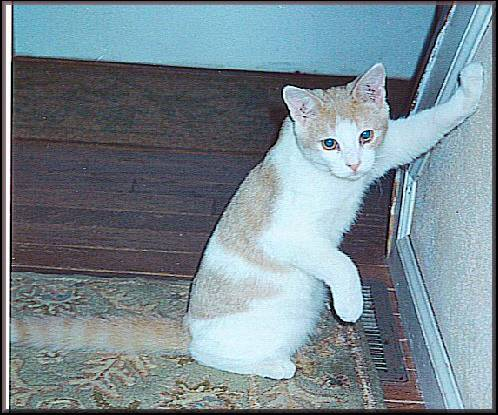
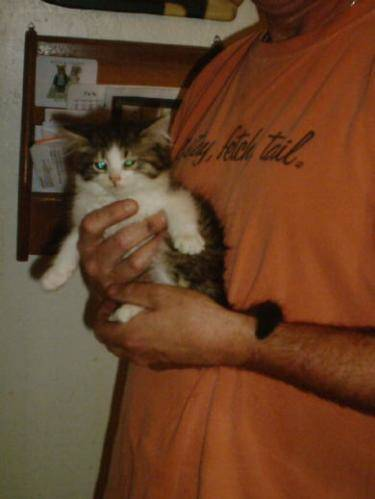
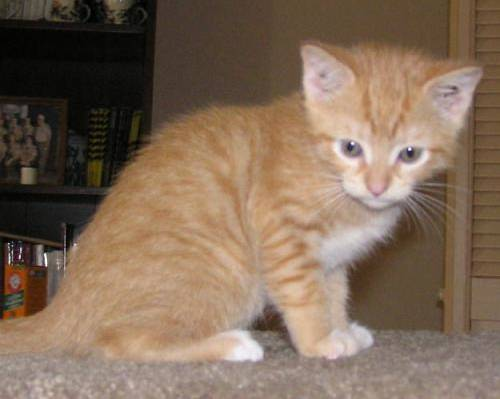
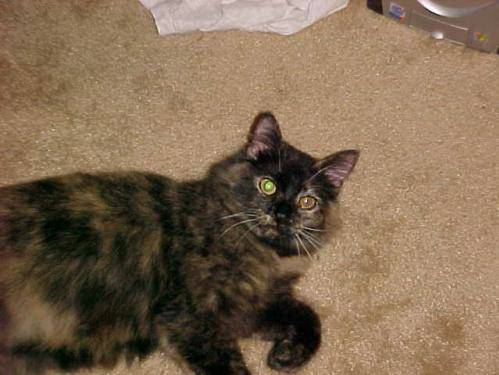
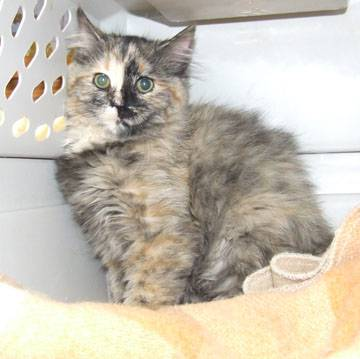
...
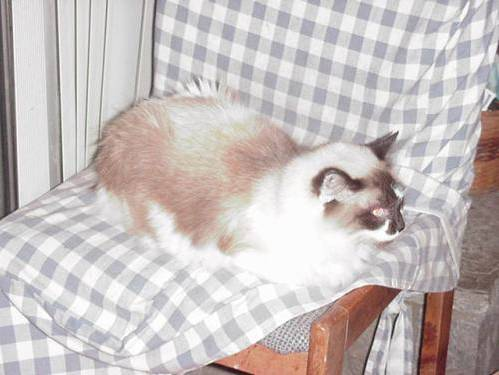
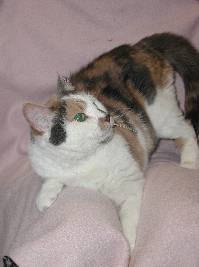
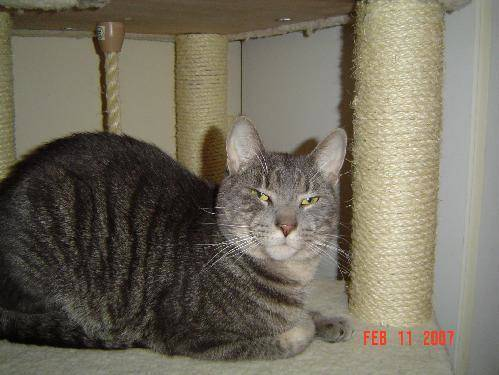
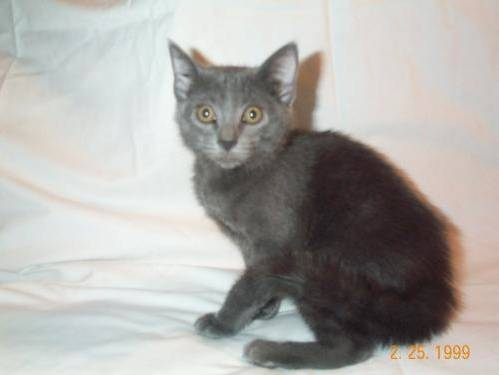
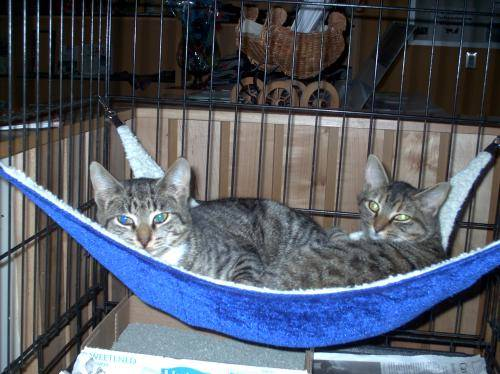

In [6]:
# Task 1. Work with a set of files.
# 1) Create a set of 15 images of different formats, sizes, and color models in a folder on the disk. Add 2-3 files that are not images.
# 2) Create a function that takes the address of the folder on the disk as an argument and returns a dataframe with the following information about the images in the folder:
# - file name;
# - color model;
# - format;
# - number of channels in the image;
# - file size in megabytes bytes rounded to two decimal places;
# - picture width;
# - image height;
# - full path to the file;
# - thumbnail image.
import os
import glob
import pandas as pd
from PIL import Image
from IPython.display import HTML
import mimetypes
import io
import base64

def image_to_base64(img):
    buffer = io.BytesIO()
    img.save(buffer, format="PNG")
    return base64.b64encode(buffer.getvalue()).decode()

def generate_image_dataframe(folder_path):
    # Generate a DataFrame with image metadata and displayable thumbnails
    # empty list to hold the information
    image_data = []

    # Get all files in the folder
    files = glob.glob(os.path.join(folder_path, '*'))

    for file in files:
        # type of the file
        mime_type, _ = mimetypes.guess_type(file)
        
        # Skip if file is not an image
        if mime_type is None or not mime_type.startswith('image'):
            continue
        
        try:
            # Open the image using Pillow
            with Image.open(file) as img:
                # Get image metadata
                file_name = os.path.basename(file)
                color_model = img.mode
                img_format = img.format
                num_channels = len(img.getbands())  # Number of channels
                file_size_mb = round(os.path.getsize(file) / (1024 * 1024), 2)  # File size in MB
                width, height = img.size
                full_path = os.path.abspath(file)
                
                # Create a thumbnail and convert it to base64 for HTML display
                thumbnail = img.copy()
                thumbnail_base64 = image_to_base64(thumbnail)
                thumbnail_html = f'<img src="data:image/png;base64,{thumbnail_base64}" />'
                
                # Append the data to the list
                image_data.append({
                    'file_name': file_name,
                    'color_model': color_model,
                    'format': img_format,
                    'num_channels': num_channels,
                    'file_size_mb': file_size_mb,
                    'width': width,
                    'height': height,
                    'full_path': full_path,
                    'thumbnail': thumbnail_html
                })
        except Exception as e:
            print(f"Error processing {file}: {e}")
            continue
    
    # a DataFrame from the collected data
    df = pd.DataFrame(image_data)
    
    return df


folder_path = './cats'

image_df = generate_image_dataframe(folder_path)

HTML(image_df.to_html(escape=False))

Poster saved: poster_variant_1.jpg
Poster saved: poster_variant_1.png
Poster saved: poster_variant_1.bmp


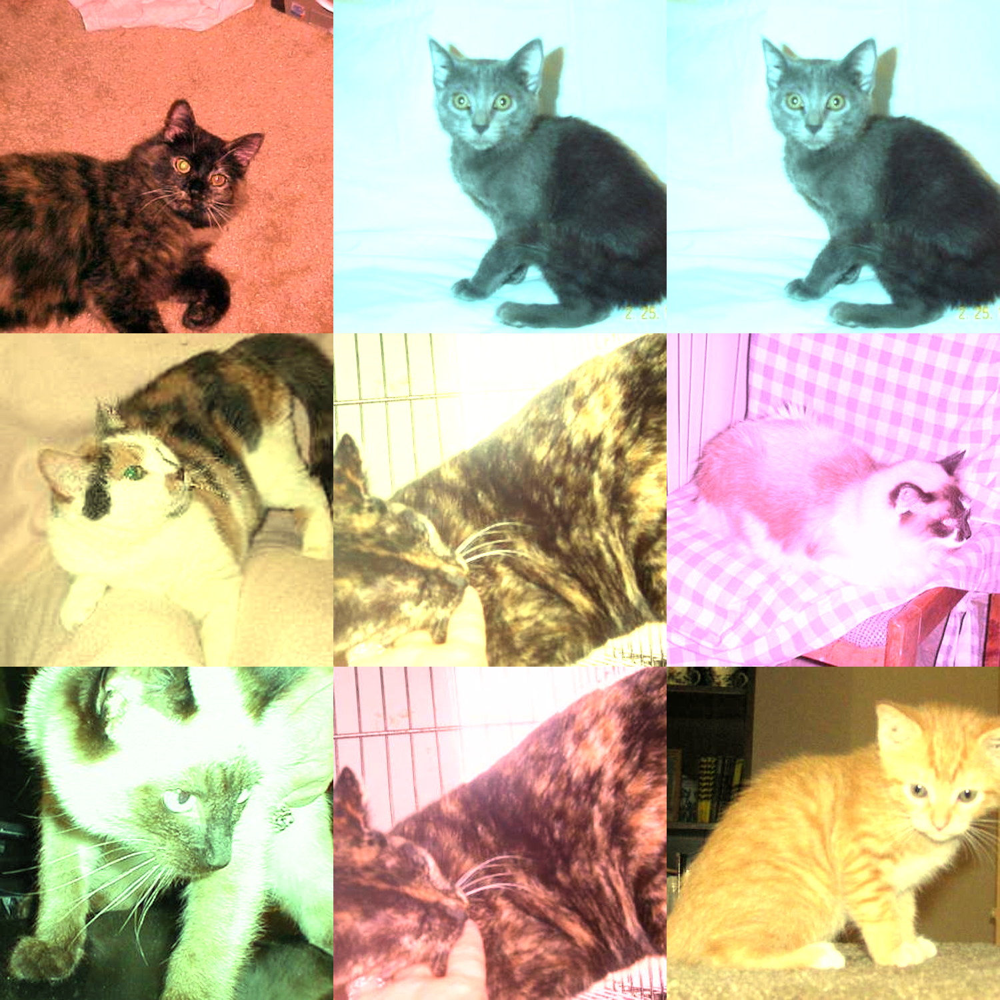

Poster saved: poster_variant_2.jpg
Poster saved: poster_variant_2.png
Poster saved: poster_variant_2.bmp


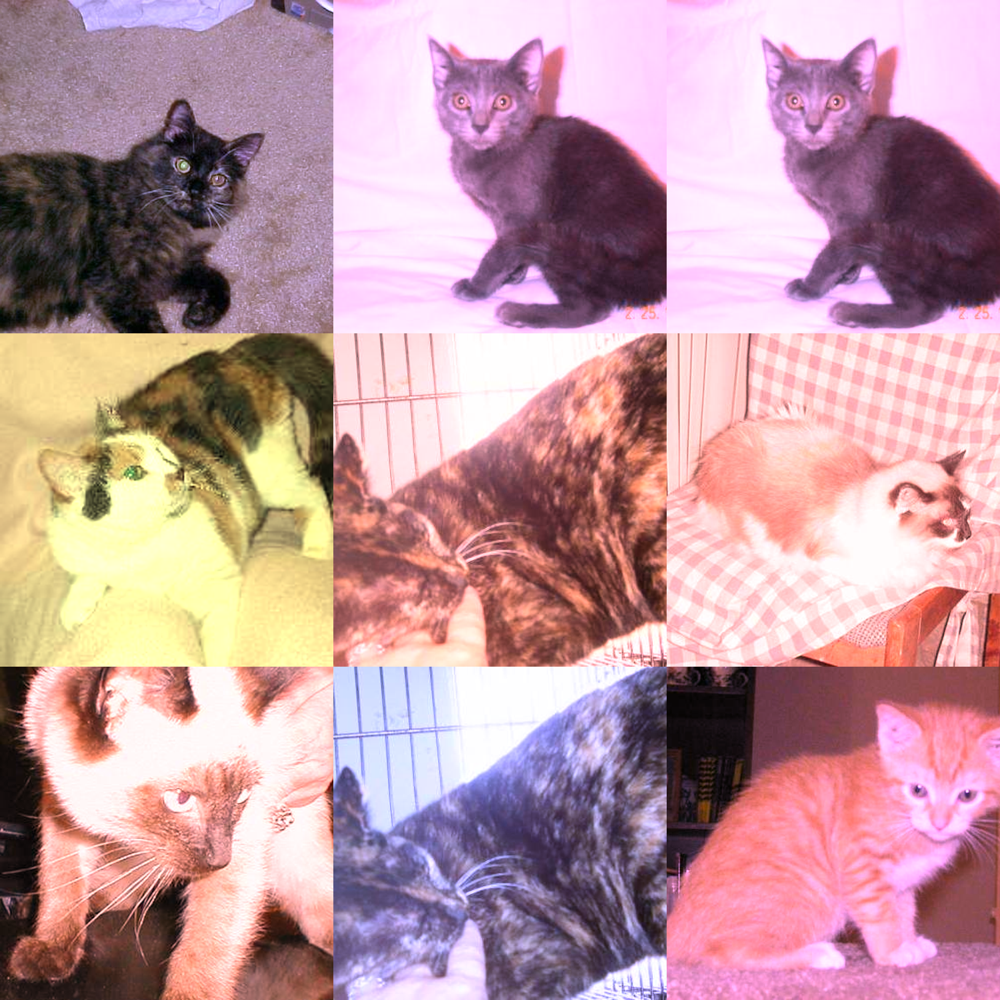

Poster saved: poster_variant_3.jpg
Poster saved: poster_variant_3.png
Poster saved: poster_variant_3.bmp


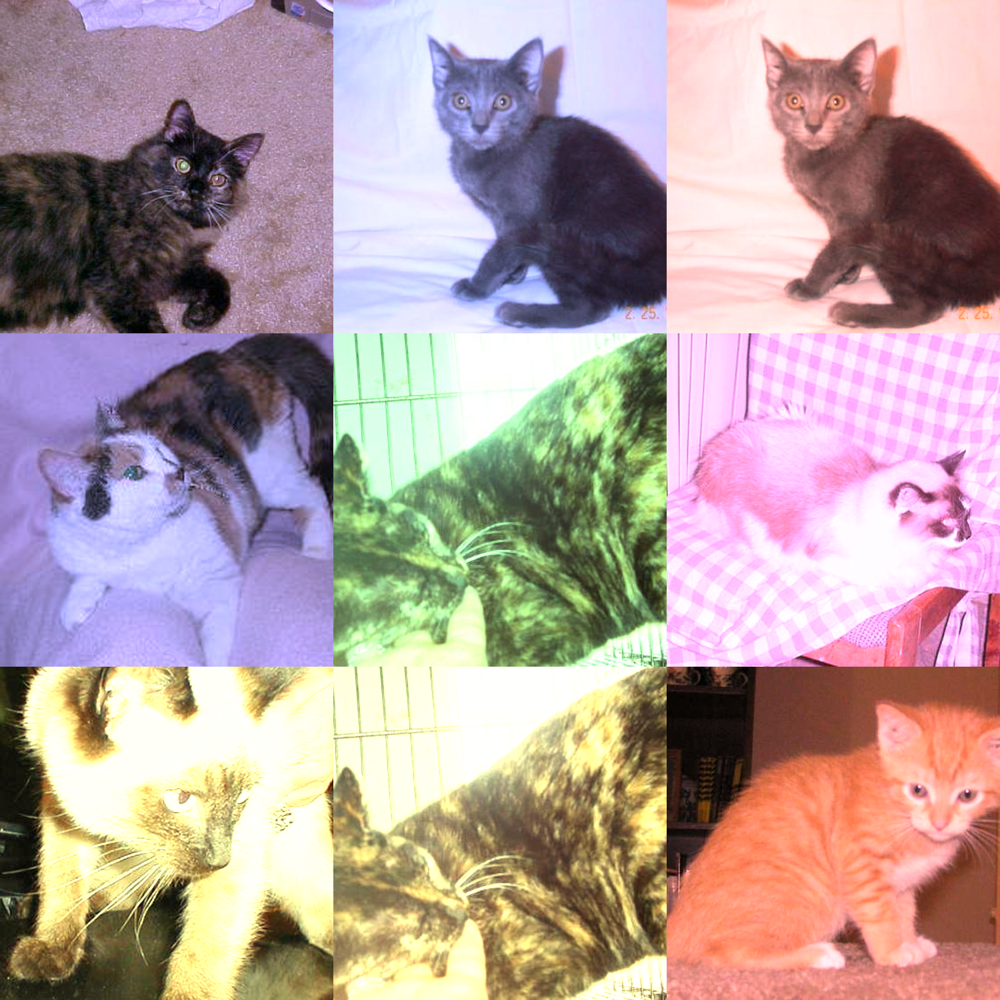

In [7]:
# Task 2.
# Create a function that takes as an argument:
# - path to the folder;
# - the name of the original image;
# - number of images in a row;
# - number of images in a column
# and returns the image of the poster.
# We assume that the poster is rectangular and the number of pictures in the poster is a  b,
# where a is the number of columns and b is the number of rows.
import os
import random
from PIL import Image, ImageEnhance
import glob
import mimetypes

def crop_to_square(image):
    # Crop the image to a square based on the smallest dimension
    width, height = image.size
    min_side = min(width, height)
    left = (width - min_side) // 2
    top = (height - min_side) // 2
    right = (width + min_side) // 2
    bottom = (height + min_side) // 2
    return image.crop((left, top, right, bottom))

def resize_image(image, size=(500, 500)):
    return image.resize(size)

def apply_random_filter(image):
    # Apply a random color filter to the image
    filters = ["red", "green", "blue", "yellow", "magenta", "cyan"]
    filter_choice = random.choice(filters)
    
    if filter_choice == "red":
        # Enhance only the red channel
        img_r, img_g, img_b = image.split()
        img_r = img_r.point(lambda p: p * 1.5)  # Enhance red channel
        return Image.merge("RGB", (img_r, img_g, img_b))
    
    elif filter_choice == "green":
        # Enhance only the green channel
        img_r, img_g, img_b = image.split()
        img_g = img_g.point(lambda p: p * 1.5)  # Enhance green channel
        return Image.merge("RGB", (img_r, img_g, img_b))
    
    elif filter_choice == "blue":
        # Enhance only the blue channel
        img_r, img_g, img_b = image.split()
        img_b = img_b.point(lambda p: p * 1.5)  # Enhance blue channel
        return Image.merge("RGB", (img_r, img_g, img_b))
    
    elif filter_choice == "yellow":
        # Enhance red and green channels to simulate yellow
        img_r, img_g, img_b = image.split()
        img_r = img_r.point(lambda p: p * 1.5)  # Enhance red channel
        img_g = img_g.point(lambda p: p * 1.5)  # Enhance green channel
        return Image.merge("RGB", (img_r, img_g, img_b))
    
    elif filter_choice == "magenta":
        # Enhance red and blue channels to simulate magenta
        img_r, img_g, img_b = image.split()
        img_r = img_r.point(lambda p: p * 1.5)  # Enhance red channel
        img_b = img_b.point(lambda p: p * 1.5)  # Enhance blue channel
        return Image.merge("RGB", (img_r, img_g, img_b))
    
    elif filter_choice == "cyan":
        # Enhance green and blue channels to simulate cyan
        img_r, img_g, img_b = image.split()
        img_g = img_g.point(lambda p: p * 1.5)  # Enhance green channel
        img_b = img_b.point(lambda p: p * 1.5)  # Enhance blue channel
        return Image.merge("RGB", (img_r, img_g, img_b))

def is_image(file_path):
    mime_type, _ = mimetypes.guess_type(file_path)
    return mime_type is not None and mime_type.startswith('image')

def generate_poster(folder_path, num_rows, num_cols, output_size=(500, 500), poster_variants=3):
    # Get all valid image files in the folder
    image_paths = [file for file in glob.glob(os.path.join(folder_path, '*')) if is_image(file)]
    
    if not image_paths:
        print("No valid image files found in the folder.")
        return
    
    selected_images = random.choices(image_paths, k=num_rows * num_cols)  # Random selection with repetition
    
    # output formats
    formats = ['jpg', 'png', 'bmp']
    
    # Create multiple poster variants
    for variant in range(1, poster_variants + 1):
        # Create a blank canvas for the poster
        poster_width = num_cols * output_size[0]
        poster_height = num_rows * output_size[1]
        poster = Image.new('RGB', (poster_width, poster_height))
        
        for i, image_path in enumerate(selected_images):
            try:
                with Image.open(image_path) as img:
                    # crop to square, resize, and apply random filter
                    img = crop_to_square(img)
                    img = resize_image(img, size=output_size)
                    img = apply_random_filter(img)
                    
                    # Calculate the position to paste the image
                    row = i // num_cols
                    col = i % num_cols
                    paste_position = (col * output_size[0], row * output_size[1])
                    
                    # Paste the image onto the poster
                    poster.paste(img, paste_position)
            except Exception as e:
                print(f"Error processing {image_path}: {e}")
                continue
        
        # Save the poster in different formats
        for fmt in formats:
            poster_filename = f"poster_variant_{variant}.{fmt}"
            poster.save(poster_filename)
            print(f"Poster saved: {poster_filename}")
       
        display(poster)

folder_path = './cats'
num_rows = 3
num_cols = 3

# Generate 3 poster variants, each saved in different formats
generate_poster(folder_path, num_rows, num_cols, output_size=(500, 500), poster_variants=3)
